Bu projede bir marketin, sisteme kayıtlı müşteri bilgileri analiz edilip müşteri segmentasyonu oluşturulacaktır. Burada asıl amaç müşterilerin benzer özellikleri ve tercihleri doğrultusunda hazırlanacak yeni kampanyalar oluşturmak, müşterilere özel indirimli ürünler sunmak ve müşteri davranışları hakkında bilgi sahibi olmaktır. Bu sayede müşteri memnuniyeti artırılarak, müşteri kayıpları minimize edilecektir. Segmentasyon Unsuperwised Learning algoritmaları ile gerçekleştirilecektir. Bu projenin içeriği aşağıdaki gibidir.

## **İçerik:**
* [1. Verini indirilmesi ve Keşif](#1)
* [2. Ön İşleme](#2)
* [3. Veri Temizliği ve Boş Verilerin Doldurulması](#3)
* [4. Tek Değişkenli Veri Analizi ve Aykırı Değerler](#4)
* [5. EDA(Keşifsel Veri Analizi)](#5)
   1. [Verilerin Dağılımlarının incelenmesi](#6)
   2. [Korelasyon Analizi](#7)
   3. [Çok değişkenli Veri Analizi ve Özellik Mühendisliği](#8)
   4. [Dağılımsal Özelliklerin Kurtosis ve Skewnesslarının incelenmesi](#9)
* [6. PCA ve Kümeleme Algoritmaları ile Segmentasyon](#10)
* [7. Sonuç](#11)


<a id="1"></a>
## **Verinin indirilmesi ve Keşif**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
import missingno as msno
import warnings


In [2]:
warnings.filterwarnings('ignore')

In [3]:
df_ = pd.read_csv('marketing_campaign.csv', sep='\t')

In [4]:
df = df_.copy()

In [5]:
df.head(5)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [6]:
print('################# Veri Şekli ################# \n')
print('Şekil: ', df.shape, '\n')
print('################# Veri Boyutu ################# \n')
print('Boyut: ', df.size, '\n')
print('################# Veri Tipleri ################# \n')
print(df.dtypes, '\n')

################# Veri Şekli ################# 

Şekil:  (2240, 29) 

################# Veri Boyutu ################# 

Boyut:  64960 

################# Veri Tipleri ################# 

ID                       int64
Year_Birth               int64
Education               object
Marital_Status          object
Income                 float64
Kidhome                  int64
Teenhome                 int64
Dt_Customer             object
Recency                  int64
MntWines                 int64
MntFruits                int64
MntMeatProducts          int64
MntFishProducts          int64
MntSweetProducts         int64
MntGoldProds             int64
NumDealsPurchases        int64
NumWebPurchases          int64
NumCatalogPurchases      int64
NumStorePurchases        int64
NumWebVisitsMonth        int64
AcceptedCmp3             int64
AcceptedCmp4             int64
AcceptedCmp5             int64
AcceptedCmp1             int64
AcceptedCmp2             int64
Complain                 int64
Z_CostC

In [7]:
print('################# Sayısal Verilerin İstatistiksel Değerleri ################# \n')
print(df.describe().T, '\n')

################# Sayısal Verilerin İstatistiksel Değerleri ################# 

                      count          mean           std     min       25%  \
ID                   2240.0   5592.159821   3246.662198     0.0   2828.25   
Year_Birth           2240.0   1968.805804     11.984069  1893.0   1959.00   
Income               2216.0  52247.251354  25173.076661  1730.0  35303.00   
Kidhome              2240.0      0.444196      0.538398     0.0      0.00   
Teenhome             2240.0      0.506250      0.544538     0.0      0.00   
Recency              2240.0     49.109375     28.962453     0.0     24.00   
MntWines             2240.0    303.935714    336.597393     0.0     23.75   
MntFruits            2240.0     26.302232     39.773434     0.0      1.00   
MntMeatProducts      2240.0    166.950000    225.715373     0.0     16.00   
MntFishProducts      2240.0     37.525446     54.628979     0.0      3.00   
MntSweetProducts     2240.0     27.062946     41.280498     0.0      1.00

In [8]:
print('################# Kolon Adları ################# \n')
print(df.columns)

################# Kolon Adları ################# 

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')


<a id="2"></a>
## **Ön İşleme**

In [9]:
df = df.rename(columns={'ID': 'ID', 'Year_Birth': 'Dogum_Yili', 'Education': 'Egitim', 'Marital_Status': 'Medeni_Durum', 'Income': 'Gelir',
                         'Kidhome': 'Cocuk_Sayisi', 'Teenhome': 'Genc_Sayisi', 'Dt_Customer': 'Musteri_Kayit', 'Recency': 'Son_Alisveris_Tarihi',
                         'MntWines': 'Harcama_Alkol', 'MntFruits': 'Harcama_Meyve', 'MntMeatProducts': 'Harcama_Et', 'MntFishProducts': 'Harcama_Balik',
                         'MntSweetProducts': 'Harcama_Tatli', 'MntGoldProds': 'Harcama_Altin', 'NumDealsPurchases': 'Indirimli_Urun_Sayisi',
                         'NumWebPurchases': 'Webden_Urun_Sayisi', 'NumCatalogPurchases': 'Katalogdan_Urun_Sayisi', 'NumStorePurchases': 'Magazadan_Urun_Sayisi',
                         'NumWebVisitsMonth': 'SonAy_Web_Ziyaret', 'AcceptedCmp3': 'Kampanya_3', 'AcceptedCmp4': 'Kampanya_4', 'AcceptedCmp5': 'Kampanya_5',
                         'AcceptedCmp1': 'Kampanya_1', 'AcceptedCmp2': 'Kampanya_2', 'Complain': 'Sikayet', 'Z_CostContact': 'Z_Iletisim_Maliyeti', 'Z_Revenue': 'Z_Gelir',
                         'Response': 'SonKampanya_Katilim'})

In [10]:
df = df[['ID', 'Dogum_Yili', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Cocuk_Sayisi', 'Genc_Sayisi', 'Gelir', 'Son_Alisveris_Tarihi',
          'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin',
          'Webden_Urun_Sayisi', 'Katalogdan_Urun_Sayisi', 'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret',
          'Indirimli_Urun_Sayisi', 'Kampanya_1', 'Kampanya_2', 'Kampanya_3', 'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet',
          'Z_Iletisim_Maliyeti', 'Z_Gelir']] # Son iki kolon değerler sabit olduğu için çıkarılacak

**Kolon Açıklamaları**

- **ID:** Müşteri numarası
- **Dogum_Yılı:** Doğum tarihi
- **Musteri_Kayit:** Müşterinin sisteme kayıt tarihi
- **Egitim:** Müşterinin eğitim düzeyi
- **Medeni_Durum:** Müşterinin medeni durumu
- **Cocuk_Sayisi:** Çocuk sayısı
- **Genc_Sayisi:** Genç sayısı
- **Gelir:** Gelir miktarı
- **Son_Alisveris_Tarihi:** Son Alışveriş yaptığı tarihten geçen gün sayısı
- **Harcama_Alkol:** Alkol ürünlerine yapılan toplam harcama
- **Harcama_Meyve:** Meyve ürünlerine yapılan toplam harcama
- **Harcama_Et:** Et ürünlerine yapılan toplam harcama
- **Harcama_Balik:** Balık ürünlerine yapılan toplam harcama
- **Harcama_Tatli:** Tatlı ürünlerine yapılan toplam harcama
- **Harcama_Altin:** Altın ürünlerine yapılan toplam harcama
- **Webden_Urun_Sayisi:** İnternet üzerinden yapılan alışveriş sayısı
- **Katalogdan_Urun_Sayisi:** Katalogtan yapılan alışveriş sayısı
- **Magazadan_Urun_Sayisi:** Mağazadan yapılan alışveriş sayısı
- **SonAy_Web_Ziyaret:** Son ayda internet sitesine yapılan ziyaret miktarı
- **Indirimli_Urun_Sayisi:** Toplam alınan indirimli ürün sayısı
- **Kampanya_1:** Kampanya 1'e katılım durumu
- **Kampanya_2:** Kampanya 2'e katılım durumu
- **Kampanya_3:** Kampanya 3'e katılım durumu
- **Kampanya_4:** Kampanya 4'e katılım durumu
- **Kampanya_5:** Kampanya 5'e katılım durumu
- **SonKampanya_Katilim:** Son Kampanyaya katılım durumu
- **Sikayet:** Müşterinin şikayette bulunma durumu

In [11]:
print('################# Objelerin Eşsiz Değerleri ################# \n')
print('Egitim: ', df['Egitim'].unique(), '\n')
print('Egitim Sayısı: ', df['Egitim'].nunique(), '\n')
print('Medeni Durum: ', df['Medeni_Durum'].unique(), '\n')
print('Medeni Durum Sayısı: ', df['Medeni_Durum'].nunique(), '\n')


################# Objelerin Eşsiz Değerleri ################# 

Egitim:  ['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle'] 

Egitim Sayısı:  5 

Medeni Durum:  ['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO'] 

Medeni Durum Sayısı:  8 



**NOT:** Burada obje olan kolonların değerlerini anlaşılabilir olması için Türkçeye çeviriyorum. Musteri_Kayıt obje olmasına rağmen tarih formatında olduğu için onu tarih olarak kullanacağız.

In [12]:
egitim_dict = {'Graduation': 'Lisans', 'PhD': 'Doktora', 'Master': 'Yuksek_Lisans', '2n Cycle': '2n_Cycle', 'Basic': 'Lise'} 
# 2n Cycle, Lisans yada Yuksek Lisans seviyesindeki eğitime denk gelmektedir. Burayı ileride Özellik mühendisliği bölümünde gelir durumuna göre diğer eğitim seviyelerine çevireceğiz.

df['Egitim'] = df['Egitim'].map(egitim_dict)

medeni_durum_dict = {'Single': 'Bekar', 'Married': 'Evli', 'Together': 'Birlikte', 'Divorced': 'Bosanmis', 'Widow': 'Dul', 'Alone': 'Yalniz', 'Absurd': 'Absurd', 'YOLO': 'YOLO'}
# Together, Alone, Absurd ve YOLO değerlerini EDA bölümünde inceledikten sonra diğer değerlere çevireceğiz.

df['Medeni_Durum'] = df['Medeni_Durum'].map(medeni_durum_dict)

<a id="3"></a>
## **3. Veri Temizliği ve Boş Verilerin Doldurulması**

**3.1 Veri Temizliği**
* Z_Iletisim_Maliyeti ve Z_Gelir kolonlarındaki değerler sabit olduğu için veri setinden temizliyoruz.

In [13]:
print('################# Z_Iletisim_Maliyeti ################# \n')
print(df['Z_Iletisim_Maliyeti'].describe())
print('################# Z_Gelir ################# \n')
print(df['Z_Gelir'].describe())

################# Z_Iletisim_Maliyeti ################# 

count    2240.0
mean        3.0
std         0.0
min         3.0
25%         3.0
50%         3.0
75%         3.0
max         3.0
Name: Z_Iletisim_Maliyeti, dtype: float64
################# Z_Gelir ################# 

count    2240.0
mean       11.0
std         0.0
min        11.0
25%        11.0
50%        11.0
75%        11.0
max        11.0
Name: Z_Gelir, dtype: float64


In [14]:
df.drop(['Z_Iletisim_Maliyeti', 'Z_Gelir'], axis=1, inplace=True)

**3.2 Boş Verilerin Doldurulması**

<Axes: >

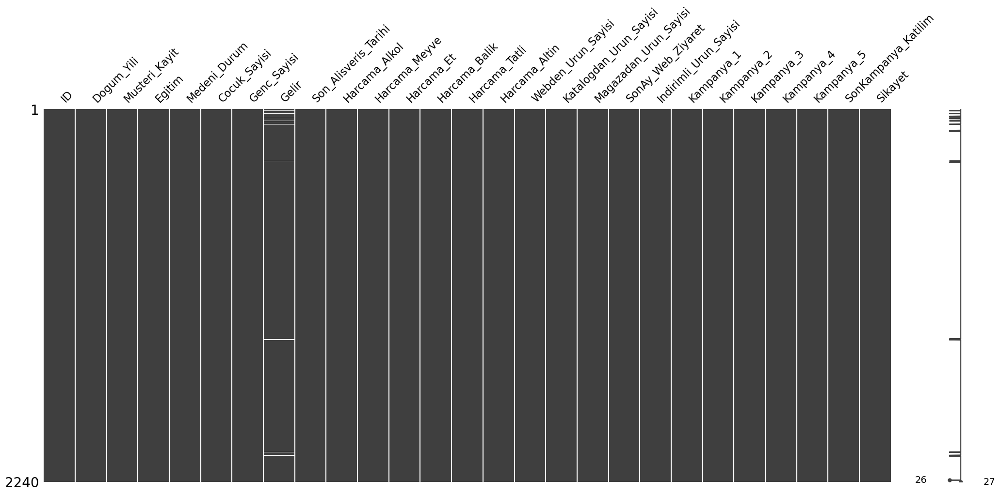

In [15]:
msno.matrix(df)

In [16]:
print('################# Eksik Veri Sayıları ################# \n')
print(df.isna().sum())

################# Eksik Veri Sayıları ################# 

ID                         0
Dogum_Yili                 0
Musteri_Kayit              0
Egitim                     0
Medeni_Durum               0
Cocuk_Sayisi               0
Genc_Sayisi                0
Gelir                     24
Son_Alisveris_Tarihi       0
Harcama_Alkol              0
Harcama_Meyve              0
Harcama_Et                 0
Harcama_Balik              0
Harcama_Tatli              0
Harcama_Altin              0
Webden_Urun_Sayisi         0
Katalogdan_Urun_Sayisi     0
Magazadan_Urun_Sayisi      0
SonAy_Web_Ziyaret          0
Indirimli_Urun_Sayisi      0
Kampanya_1                 0
Kampanya_2                 0
Kampanya_3                 0
Kampanya_4                 0
Kampanya_5                 0
SonKampanya_Katilim        0
Sikayet                    0
dtype: int64


**NOT:** Burada tek eksik verinin bulunduğu kolon Gelir.Burada birkaç şey yapılabilinir; o satırlar veri setinden atılabilir, ortalama ile doldurulabilir veya diğer kolonlara bağlı olarak doldurulabilir. Ben son seçeneği seçerek ileride yapacağımız özellik mühendisliğinin bir kısmını burada yapacağım. Bu sayade eksik Gelir değeri veri setine daha uygun birşekilde doldurulmuş olacak.

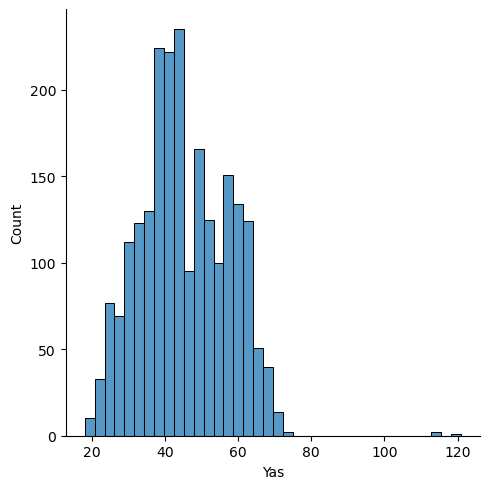

In [17]:
df['Yas'] = 2014 - df['Dogum_Yili'] # 2014 yılı veri setinin alındığı yıl olduğu için 2014 yılından doğum yılını çıkartarak yaş hesaplanmıştır.
sns.displot(df['Yas'])

In [18]:
print('################# Yaş Dağılımı ################# \n')
print(df['Yas'].describe())

################# Yaş Dağılımı ################# 

count    2240.000000
mean       45.194196
std        11.984069
min        18.000000
25%        37.000000
50%        44.000000
75%        55.000000
max       121.000000
Name: Yas, dtype: float64


**NOT:** Burada aykırı değerler var onlarla daha sonra ilgileneceğiz.

In [19]:
df['Yas_Aralik'] = pd.cut(df['Yas'], [0, 35, 45, 55, 70, np.inf], labels=['0-35', '35-45', '45-55', '55-70', '70+']) # Yaş aralıklarını belirledik
df['Gelir'] = df.groupby(['Yas_Aralik','Egitim','Medeni_Durum'])['Gelir'].transform(lambda x: x.fillna(x.mean())) # Gelir değerlerini yaş aralığı, eğitim ve medeni duruma göre doldurduk
df.drop(['Dogum_Yili', 'Yas_Aralik'], axis=1, inplace=True) # Dogum_yili ve Yas_Aralik kolonlarını, Yas kolonu daha kuvvetli bir veri olduğu için çıkarıyoruz

In [20]:
print('################# Eksik Veri Sayıları ################# \n')
print('Toplam Eksik Veri: ',df.isna().sum().sum())

################# Eksik Veri Sayıları ################# 

Toplam Eksik Veri:  1


In [21]:
df['Gelir'].fillna(df['Gelir'].mean(), inplace=True) # Tek eksik veri olduğu için ortalama ile dolduruyorum

In [22]:
import datetime as dt

df['Musteri_Kayit'] = pd.to_datetime(df['Musteri_Kayit'], dayfirst=True).dt.year
df['Musteri_Kayit'] = 2014 - df['Musteri_Kayit'] # 2014 yılı veri setinin alındığı yıl olduğu için 2014 yılından müşteri kayıt yılını çıkartarak müşteri kayıt süresi hesaplanmıştır.

<a id="4"></a>
## **4.Tek Değişkenli Veri Analizi ve Aykırı Değerler**
* Burada verideki aykırı değerleri inceleyip temizlemeye çalışacağız. Örneğin yukarıdaki 120+ Yas değerleri.


In [23]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.0
Musteri_Kayit,2240.0,0.971875,0.684554,0.0,1.00,1.0,1.00,2.0
Cocuk_Sayisi,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.0
Genc_Sayisi,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.0
Gelir,2240.0,52239.876303,25045.040102,1730.0,35538.75,51411.5,68289.75,666666.0
Son_Alisveris_Tarihi,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.0
Harcama_Alkol,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.0
Harcama_Meyve,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.0
Harcama_Et,2240.0,166.950000,225.715373,0.0,16.00,67.0,232.00,1725.0
Harcama_Balik,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.0


array([[<Axes: title={'center': 'ID'}>,
        <Axes: title={'center': 'Musteri_Kayit'}>,
        <Axes: title={'center': 'Cocuk_Sayisi'}>,
        <Axes: title={'center': 'Genc_Sayisi'}>,
        <Axes: title={'center': 'Gelir'}>],
       [<Axes: title={'center': 'Son_Alisveris_Tarihi'}>,
        <Axes: title={'center': 'Harcama_Alkol'}>,
        <Axes: title={'center': 'Harcama_Meyve'}>,
        <Axes: title={'center': 'Harcama_Et'}>,
        <Axes: title={'center': 'Harcama_Balik'}>],
       [<Axes: title={'center': 'Harcama_Tatli'}>,
        <Axes: title={'center': 'Harcama_Altin'}>,
        <Axes: title={'center': 'Webden_Urun_Sayisi'}>,
        <Axes: title={'center': 'Katalogdan_Urun_Sayisi'}>,
        <Axes: title={'center': 'Magazadan_Urun_Sayisi'}>],
       [<Axes: title={'center': 'SonAy_Web_Ziyaret'}>,
        <Axes: title={'center': 'Indirimli_Urun_Sayisi'}>,
        <Axes: title={'center': 'Kampanya_1'}>,
        <Axes: title={'center': 'Kampanya_2'}>,
        <Axes: tit

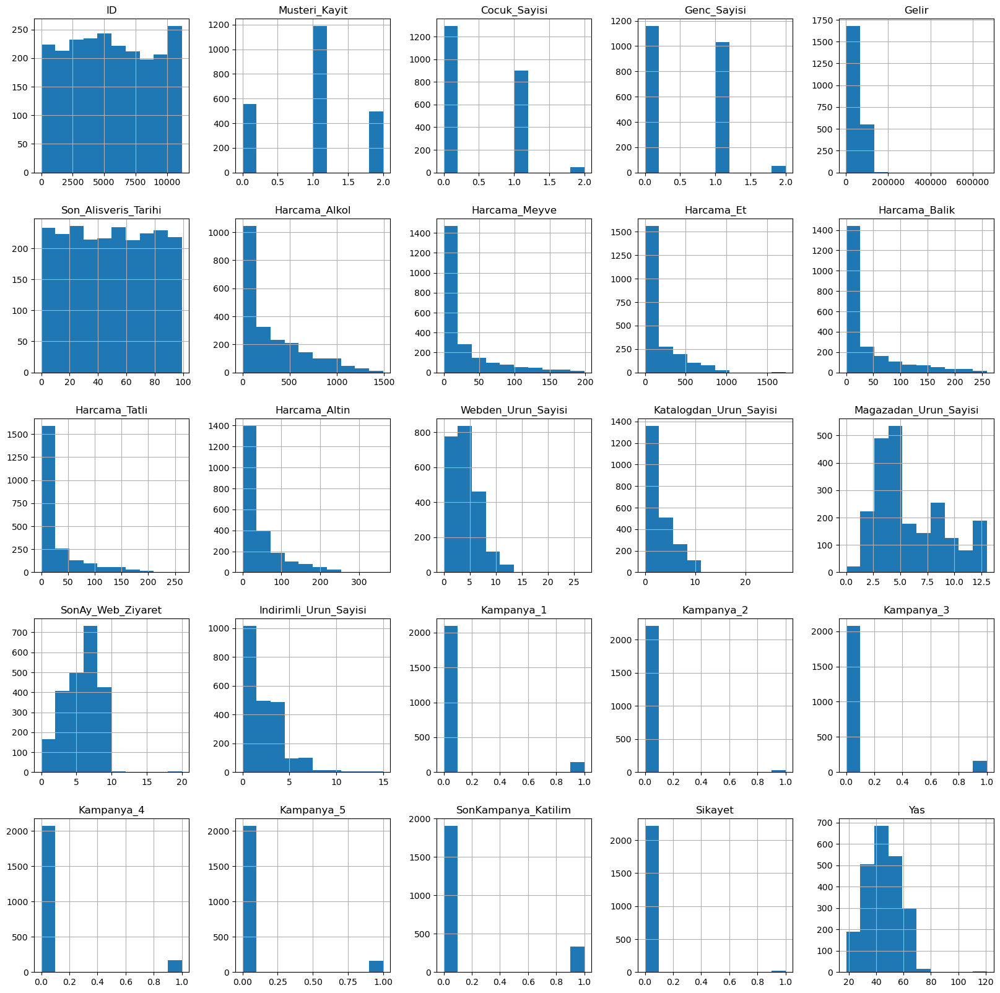

In [24]:
df.hist(figsize=(20, 20))

In [25]:
def outlier_thresholds(df, col, low, high, q_scaler):
    lower_quartile = df[col].quantile(low)
    upper_quartile = df[col].quantile(high)
    interquantile_range = upper_quartile - lower_quartile
    up_limit = upper_quartile + q_scaler * interquantile_range
    low_limit = lower_quartile - q_scaler * interquantile_range
    return low_limit, up_limit

def outlier_checker(df, cols=df.columns, low=0.01, high=0.99, q_scaler=1.5):
    for col in cols:
        low_limit, up_limit = outlier_thresholds(df, col, low, high, q_scaler)
        if df[(df[col] > up_limit) | (df[col] < low_limit)].any(axis=None):
            print(col, 'kolonunda aykırı değer saptandı.(O)')
        else:
            print(col, 'kolonunda aykırı değer saptanmadı.(X)')

def replace_with_thresholds(df, cols, low, high, q_scaler):
    for col in cols:
        low_limit, up_limit = outlier_thresholds(df, col, low, high, q_scaler)
        df.loc[(df[col] < low_limit), col] = low_limit
        df.loc[(df[col] > up_limit), col] = up_limit

In [26]:
n_df = df.select_dtypes(include=['int64', 'float64'])
n_df.drop(['Kampanya_1', 'Kampanya_2', 'Kampanya_3', 'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet'], axis=1, inplace=True)

In [27]:
print('################# Aykırı Değerler ################# \n')
outlier_checker(df, cols=n_df.columns,low=0.01, high=0.99, q_scaler=0.5)

################# Aykırı Değerler ################# 

ID kolonunda aykırı değer saptanmadı.(X)
Cocuk_Sayisi kolonunda aykırı değer saptanmadı.(X)
Genc_Sayisi kolonunda aykırı değer saptanmadı.(X)
Gelir kolonunda aykırı değer saptandı.(O)
Son_Alisveris_Tarihi kolonunda aykırı değer saptanmadı.(X)
Harcama_Alkol kolonunda aykırı değer saptanmadı.(X)
Harcama_Meyve kolonunda aykırı değer saptanmadı.(X)
Harcama_Et kolonunda aykırı değer saptandı.(O)
Harcama_Balik kolonunda aykırı değer saptanmadı.(X)
Harcama_Tatli kolonunda aykırı değer saptanmadı.(X)
Harcama_Altin kolonunda aykırı değer saptandı.(O)
Webden_Urun_Sayisi kolonunda aykırı değer saptandı.(O)
Katalogdan_Urun_Sayisi kolonunda aykırı değer saptandı.(O)
Magazadan_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
SonAy_Web_Ziyaret kolonunda aykırı değer saptandı.(O)
Indirimli_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
Yas kolonunda aykırı değer saptandı.(O)


In [28]:
replace_with_thresholds(df, cols=n_df.columns,low=0.01, high=0.99, q_scaler=0.5)
print('################# Aykırı Değerler ################# \n')
outlier_checker(df, cols=n_df.columns,low=0.01, high=0.99, q_scaler=0.5)

################# Aykırı Değerler ################# 

ID kolonunda aykırı değer saptanmadı.(X)
Cocuk_Sayisi kolonunda aykırı değer saptanmadı.(X)
Genc_Sayisi kolonunda aykırı değer saptanmadı.(X)
Gelir kolonunda aykırı değer saptanmadı.(X)
Son_Alisveris_Tarihi kolonunda aykırı değer saptanmadı.(X)
Harcama_Alkol kolonunda aykırı değer saptanmadı.(X)
Harcama_Meyve kolonunda aykırı değer saptanmadı.(X)
Harcama_Et kolonunda aykırı değer saptanmadı.(X)
Harcama_Balik kolonunda aykırı değer saptanmadı.(X)
Harcama_Tatli kolonunda aykırı değer saptanmadı.(X)
Harcama_Altin kolonunda aykırı değer saptanmadı.(X)
Webden_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
Katalogdan_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
Magazadan_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
SonAy_Web_Ziyaret kolonunda aykırı değer saptanmadı.(X)
Indirimli_Urun_Sayisi kolonunda aykırı değer saptanmadı.(X)
Yas kolonunda aykırı değer saptanmadı.(X)


In [29]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ID,2240.0,5592.159821,3246.662198,0.0,2828.25,5458.5,8427.75,11191.000
Musteri_Kayit,2240.0,0.971875,0.684554,0.0,1.00,1.0,1.00,2.000
Cocuk_Sayisi,2240.0,0.444196,0.538398,0.0,0.00,0.0,1.00,2.000
Genc_Sayisi,2240.0,0.506250,0.544538,0.0,0.00,0.0,1.00,2.000
Gelir,2240.0,51940.587232,21206.276570,1730.0,35538.75,51411.5,68289.75,137803.560
Son_Alisveris_Tarihi,2240.0,49.109375,28.962453,0.0,24.00,49.0,74.00,99.000
Harcama_Alkol,2240.0,303.935714,336.597393,0.0,23.75,173.5,504.25,1493.000
Harcama_Meyve,2240.0,26.302232,39.773434,0.0,1.00,8.0,33.00,199.000
Harcama_Et,2240.0,166.323438,221.929496,0.0,16.00,67.0,232.00,1371.500
Harcama_Balik,2240.0,37.525446,54.628979,0.0,3.00,12.0,50.00,259.000


<a id="5"></a>
## **5. EDA(Keşifsel Veri Analizi)**


<a id="6"></a>
**5.1. Verilerin Dağılımlarının incelenmesi**

In [30]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Cocuk_Sayisi',
       'Genc_Sayisi', 'Gelir', 'Son_Alisveris_Tarihi', 'Harcama_Alkol',
       'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli',
       'Harcama_Altin', 'Webden_Urun_Sayisi', 'Katalogdan_Urun_Sayisi',
       'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret', 'Indirimli_Urun_Sayisi',
       'Kampanya_1', 'Kampanya_2', 'Kampanya_3', 'Kampanya_4', 'Kampanya_5',
       'SonKampanya_Katilim', 'Sikayet', 'Yas'],
      dtype='object')

array([[<Axes: title={'center': 'ID'}>,
        <Axes: title={'center': 'Musteri_Kayit'}>,
        <Axes: title={'center': 'Cocuk_Sayisi'}>,
        <Axes: title={'center': 'Genc_Sayisi'}>,
        <Axes: title={'center': 'Gelir'}>],
       [<Axes: title={'center': 'Son_Alisveris_Tarihi'}>,
        <Axes: title={'center': 'Harcama_Alkol'}>,
        <Axes: title={'center': 'Harcama_Meyve'}>,
        <Axes: title={'center': 'Harcama_Et'}>,
        <Axes: title={'center': 'Harcama_Balik'}>],
       [<Axes: title={'center': 'Harcama_Tatli'}>,
        <Axes: title={'center': 'Harcama_Altin'}>,
        <Axes: title={'center': 'Webden_Urun_Sayisi'}>,
        <Axes: title={'center': 'Katalogdan_Urun_Sayisi'}>,
        <Axes: title={'center': 'Magazadan_Urun_Sayisi'}>],
       [<Axes: title={'center': 'SonAy_Web_Ziyaret'}>,
        <Axes: title={'center': 'Indirimli_Urun_Sayisi'}>,
        <Axes: title={'center': 'Kampanya_1'}>,
        <Axes: title={'center': 'Kampanya_2'}>,
        <Axes: tit

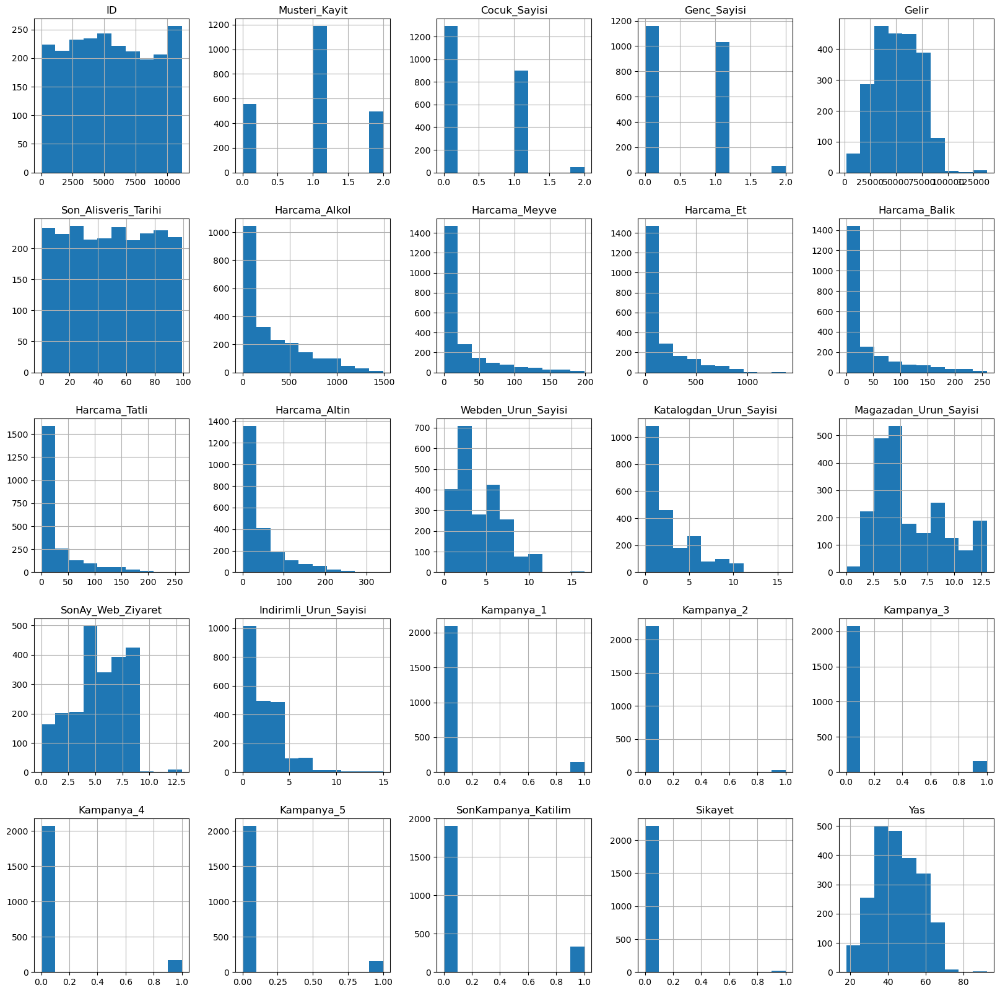

In [31]:
df.hist(figsize=(20, 20))

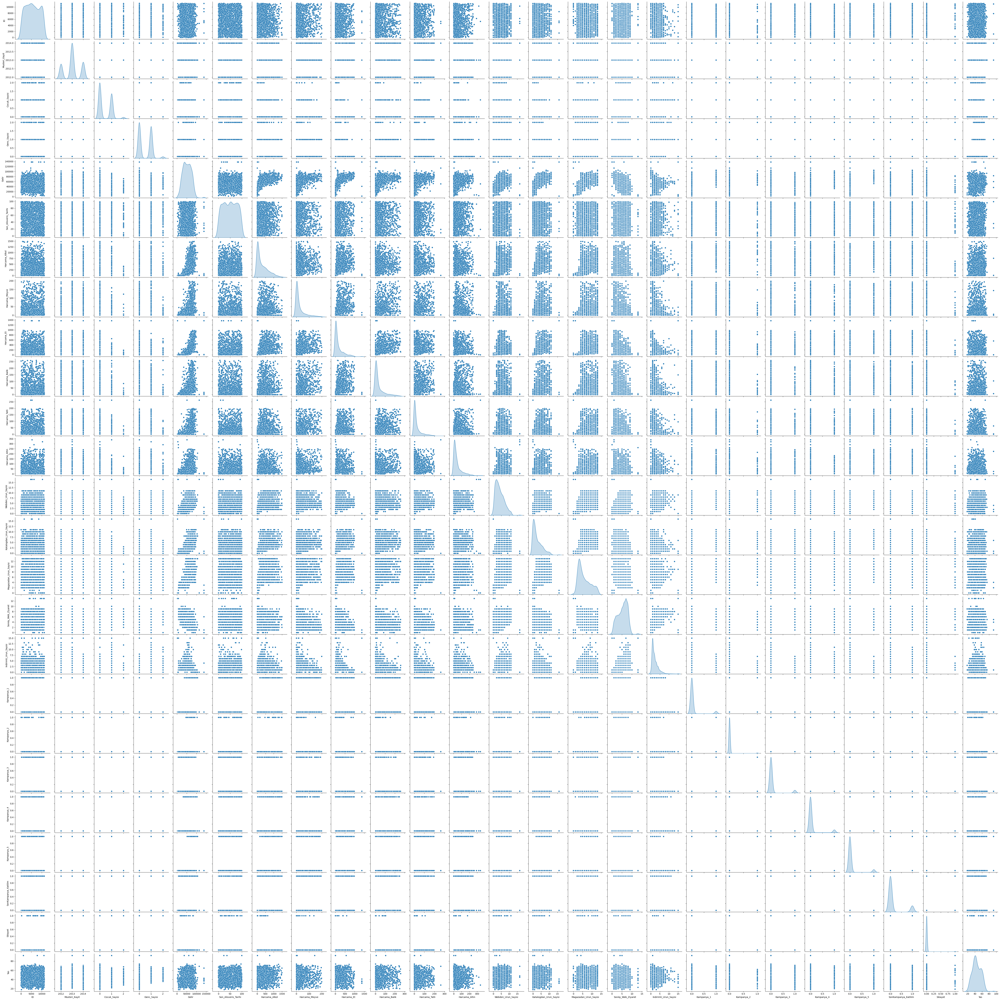

In [32]:
#sns.pairplot(df, diag_kind='kde')
Image(filename='pairplot.png')

<a id="7"></a>
**5.2. Korelasyon Analizi**

In [33]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Cocuk_Sayisi',
       'Genc_Sayisi', 'Gelir', 'Son_Alisveris_Tarihi', 'Harcama_Alkol',
       'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli',
       'Harcama_Altin', 'Webden_Urun_Sayisi', 'Katalogdan_Urun_Sayisi',
       'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret', 'Indirimli_Urun_Sayisi',
       'Kampanya_1', 'Kampanya_2', 'Kampanya_3', 'Kampanya_4', 'Kampanya_5',
       'SonKampanya_Katilim', 'Sikayet', 'Yas'],
      dtype='object')

Korelasyondan önce medeni durum ve eğitim durumlarını inceliyorum.

<Axes: xlabel='Genc_Sayisi', ylabel='Count'>

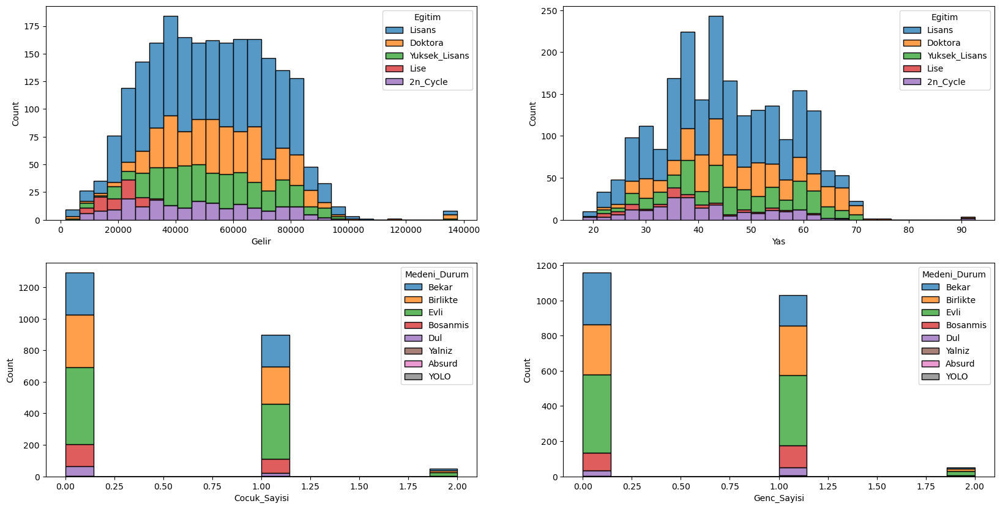

In [34]:
fig , ax = plt.subplots(2, 2, figsize=(20, 10))

sns.histplot(x=df['Gelir'], hue=df['Egitim'], multiple='stack' , ax= ax[0,0])
sns.histplot(x=df['Yas'], hue=df['Egitim'], multiple='stack', ax= ax[0,1])
sns.histplot(x=df['Cocuk_Sayisi'], hue=df['Medeni_Durum'], multiple='stack', ax= ax[1,0])
sns.histplot(x=df['Genc_Sayisi'], hue=df['Medeni_Durum'], multiple='stack', ax= ax[1,1])

In [35]:
YOLO_values = df[df['Medeni_Durum'] == 'YOLO'][['Cocuk_Sayisi', 'Genc_Sayisi', 'Yas']].mean()
YOLO_count = df[df['Medeni_Durum'] == 'YOLO'].shape[0]
print("################# YOLO Değerleri ################# \n")
print(YOLO_values)
print("YOLO sayısı: ", YOLO_count)

Absurd_values = df[df['Medeni_Durum'] == 'Absurd'][['Cocuk_Sayisi', 'Genc_Sayisi', 'Yas']].mean()
Absurd_count = df[df['Medeni_Durum'] == 'Absurd'].shape[0]
print("################# Absurd Değerleri ################# \n")
print(Absurd_values)
print("Absurd sayısı: ", Absurd_count)

################# YOLO Değerleri ################# 

Cocuk_Sayisi     0.0
Genc_Sayisi      1.0
Yas             41.0
dtype: float64
YOLO sayısı:  2
################# Absurd Değerleri ################# 

Cocuk_Sayisi     0.0
Genc_Sayisi      0.0
Yas             39.0
dtype: float64
Absurd sayısı:  2


Yukarıdaki grafiklerden yola çıkarak, Eğitim durumu 2n_Cycle olanları Lisans ile, medeni durumları YOLO ve Absurd olanları Bekar ile eşleştiriyorum. Bunların yanı sıra Eğitim seviyelerini Liseden doktoraya artacak şekilde, medeni durumları da Bekar, Bosanmıs, Birlikte ve Evli olacak şekilde düzenliyorum. Bu sayede, bu kolonların korelasyon değerleri daha anlamlı olmuş oluyor.

In [36]:
egitim_map = {'Lisans': 1, 'Doktora': 3, 'Yuksek_Lisans': 2, '2n_Cycle': 1, 'Lise': 0}
egitim_palette = {0: "#561643" , 1: "#a30039" , 2: "#e4572e", 3:"#b8b42d"}
medeni_durum_map = {'Bekar': 0, 'Evli': 3, 'Birlikte': 2, 'Bosanmis': 1, 'Dul': 1, 'Yalniz': 0, 'Absurd': 0, 'YOLO': 0}

df['Egitim'] = df['Egitim'].map(egitim_map)
df['Medeni_Durum'] = df['Medeni_Durum'].map(medeni_durum_map)


<Axes: >

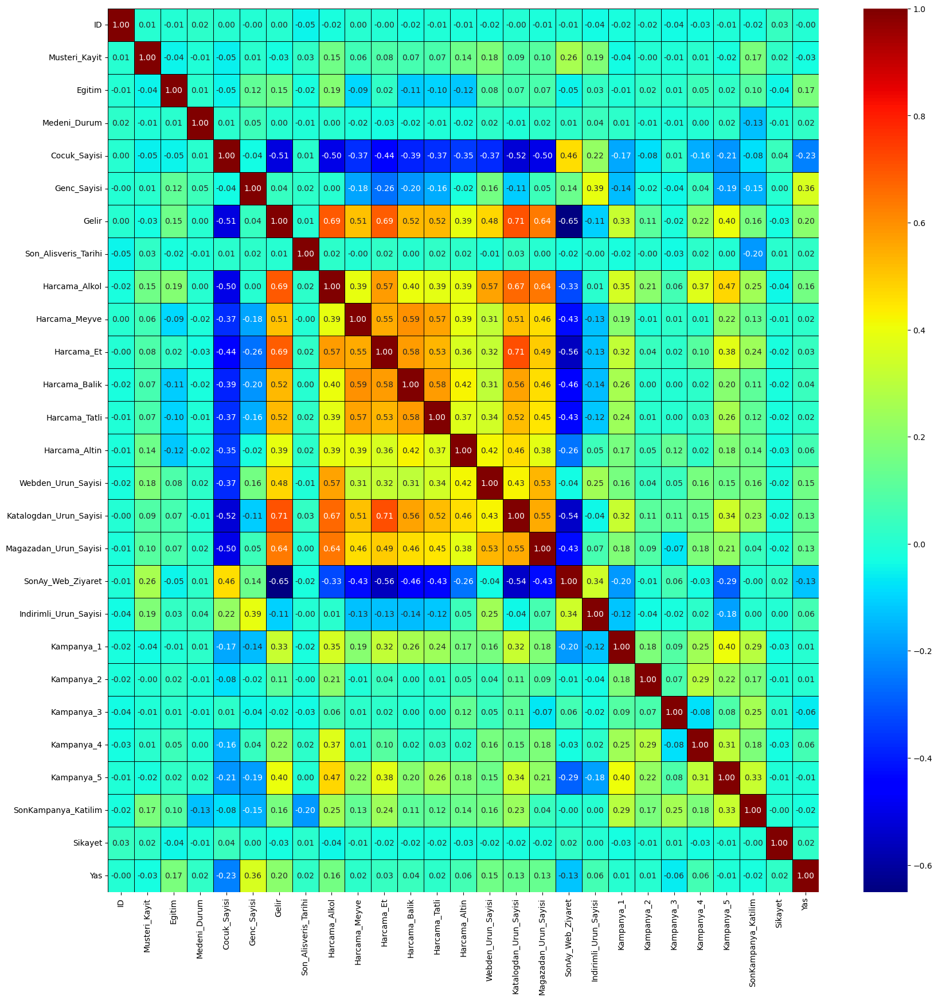

In [37]:
corr_matrix = df.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='jet', linewidths=0.5, linecolor='black')

**Korelasyon Matriksinde yapılan çıkarımlar**
* Musteri_Kayit: Orta korelasyon.
* Egitim: Orta korelasyon. Eğitim seviyesi arttıkça alkol harcaması artarmakta, meyve,balık, tatlı ve altın harcaması azamlmakta.
* Medeni_Durum: Zayif korelasyon.
* Cocuk_Sayisi ve Genc_Sayisi: Güçlü korelasyon. Çocuk sayısı arttıkça harcama miktarları düşüyor ve indirimli ürün tercihleri artıyor. Bu iki değer toplanarak tekrar korelasyon değerlerine bakılacak.
* Gelir: Güçlü korelasyon.
* Son_Alisveris_Tarihi: Zayıf korelasyon.
* Harcama_Alkol ve Diğer Harcamalar: Güçlü korelasyon. Bütün harcamalar toplanarak yeni bir kolon oluşturulduktan sonra tekrar korelasyon değerlerine bakılacak.
* Urun_Sayisi kolonları: İyi korelasyon.  
* SonAy_Web_Ziyaret ve Indirimli_Urun_Sayisi: İyi korelasyon. Son ay internet sitesini ziyaret sayısının artması müşterilerin genellikle indirimli ürün tercih ettiğini gösteriyor.
* Kampanyalar: Orta korelasyon. Kampanyalara bakıldığında, Alkol ve Et harcamalarından yola çıkılarak 1. ve 5. kampayaların yıl başı veya benzeri bir tarihte gerçekleştiği çıkarımında bulunulabilir.
* Sikayet: Zayif korelasyon.
* Yas: Orta korelasyon. Bazı korelasyonlar zayıfta olsa yaşa bağlı olarak müşteri envanterlerinin tercihleri hakkında çıkarımlar yapılabilir.

**NOT:** Unsupervised learning ile kümeleme yapılacağı için burada yapılmış olan çıkarımlar ilerleyen adımlarda kullanılacak.


In [38]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Cocuk_Sayisi',
       'Genc_Sayisi', 'Gelir', 'Son_Alisveris_Tarihi', 'Harcama_Alkol',
       'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli',
       'Harcama_Altin', 'Webden_Urun_Sayisi', 'Katalogdan_Urun_Sayisi',
       'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret', 'Indirimli_Urun_Sayisi',
       'Kampanya_1', 'Kampanya_2', 'Kampanya_3', 'Kampanya_4', 'Kampanya_5',
       'SonKampanya_Katilim', 'Sikayet', 'Yas'],
      dtype='object')

<a id="8"></a>
**5.3. Çok değişkenli Veri Analizi ve Özellik Mühendisliği**

In [39]:
df['Toplam_Cocuk'] = df['Cocuk_Sayisi'] + df['Genc_Sayisi']

df['Toplam_Hane'] = np.where((df['Medeni_Durum'] == 2) | (df['Medeni_Durum'] == 3), 2, 1) + df['Toplam_Cocuk'] # Medeni durum 2 ve 3 olanlar partneri ile, diğerleri partnersiz yaşıyor şeklinde kabul edildi.

df['Evebeyn'] = np.where(df['Toplam_Cocuk'] > 0, 1, 0)

df['Toplam_Harcama'] = df['Harcama_Alkol'] + df['Harcama_Meyve'] + df['Harcama_Et'] + df['Harcama_Balik'] + df['Harcama_Tatli'] + df['Harcama_Altin']

df['Toplam_Urun'] = df['Webden_Urun_Sayisi'] + df['Katalogdan_Urun_Sayisi'] + df['Magazadan_Urun_Sayisi']

df['Toplam_Kampanya'] = df['Kampanya_1'] + df['Kampanya_2'] + df['Kampanya_3'] + df['Kampanya_4'] + df['Kampanya_5'] + df['SonKampanya_Katilim']

df.drop(['Cocuk_Sayisi', 'Genc_Sayisi'], axis=1, inplace=True)

<Axes: >

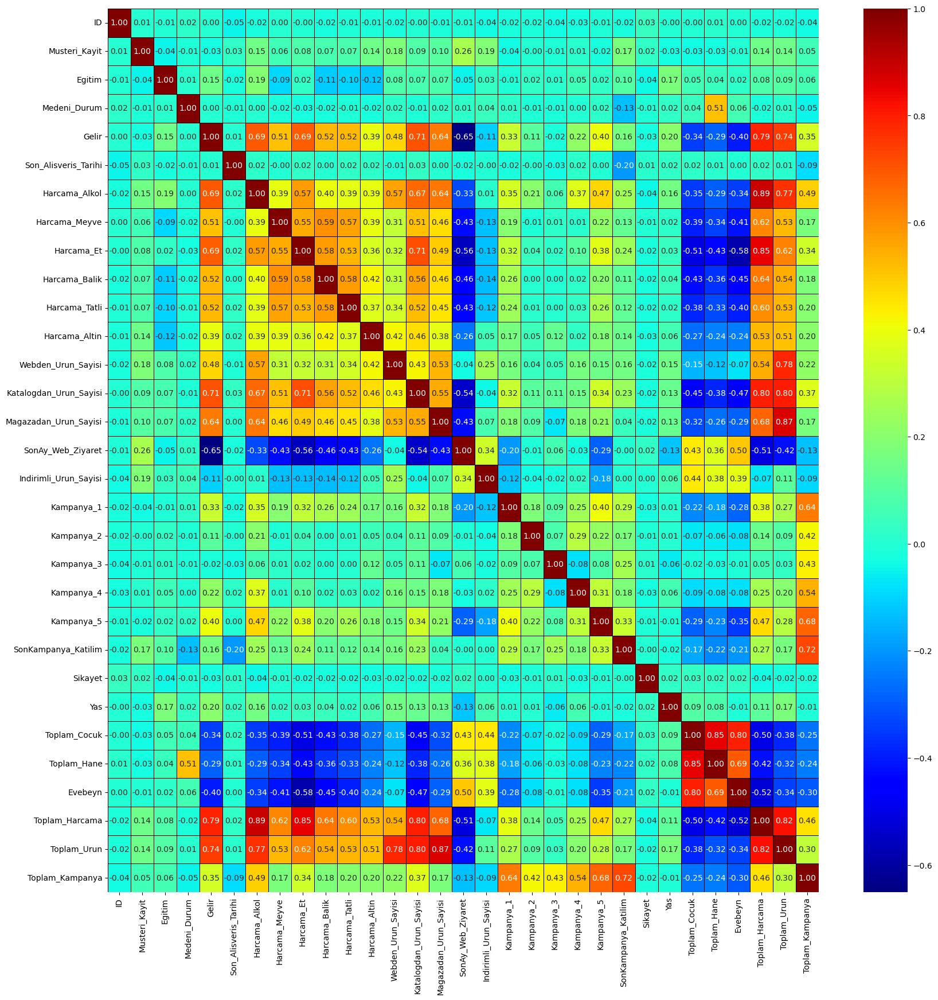

In [40]:
corr_matrix = df.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='jet', linewidths=0.5, linecolor='black')

<Axes: title={'center': 'Yaş ve Gelir Dağılımı'}, xlabel='Gelir', ylabel='Yas'>

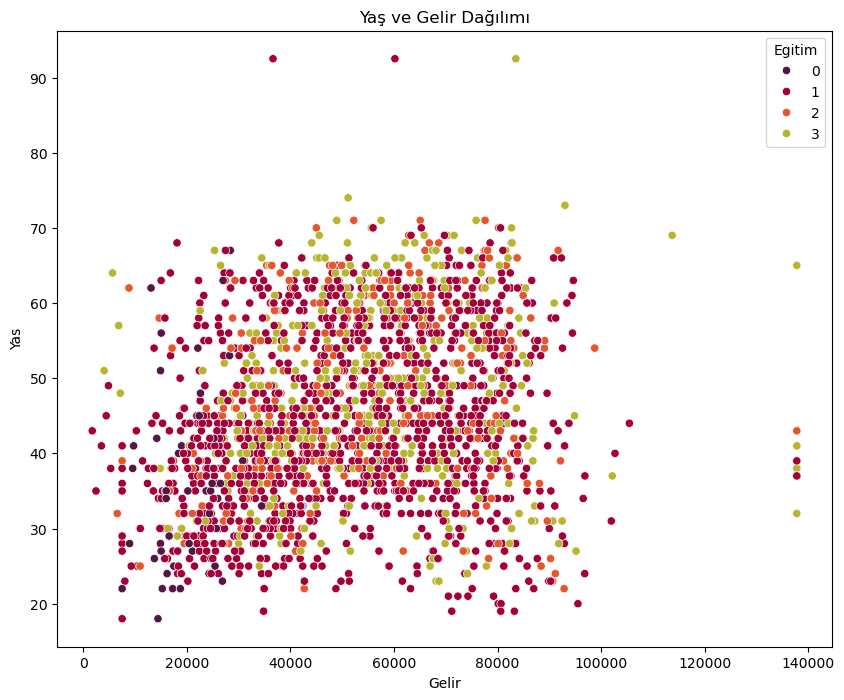

In [41]:
plt.figure(figsize=(10, 8))
plt.title('Yaş ve Gelir Dağılımı')
sns.scatterplot(x='Gelir', y='Yas', hue='Egitim',palette=egitim_palette, data=df)

In [42]:
#Yüzdelik gelir dağılımlarını Eğitim, Medeni Durum ve Çocuk Sayısına göre gösteren bir sunburst grafiği oluşturuldu. Github üzerinden görüntüleyemeyebilirsiniz.
import plotly.express as px

df_sb = df.copy()
df_sb['Gelir_yuzde'] = 100 * df_sb['Gelir'] / df_sb['Gelir'].sum()
df_sb['Gelir_ort'] = df_sb.groupby('Egitim')['Gelir'].transform('mean')
df_sb['Yas_ort'] = df_sb.groupby('Egitim')['Yas'].transform('mean')
df_sb['Harcama_yuzde'] = 100 * df_sb['Toplam_Harcama'] / df_sb['Toplam_Harcama'].sum()


fig = px.sunburst(df_sb, path=['Egitim','Medeni_Durum','Musteri_Kayit'], values='Gelir_yuzde' , color='Egitim', color_discrete_map=egitim_palette, hover_data=['Gelir_ort','Yas_ort','Harcama_yuzde'],
 title='Eğitim, Medeni Durum ve Çocuk Sayısına Göre Gelir Grafiği', labels={'Egitim':'Eğitim','Medeni_Durum':'Medeni Durum','Toplam_Cocuk':'Çocuk Sayısı','Gelir_yuzde':'Gelir Yüzdesi','Gelir_ort':'Ortalama Gelir','Gelir':'Gelir','Yas_ort':'Ortalama Yaş','Harcama_yuzde':'Harcama Yüzdesi'})
fig.update_layout(width=800, height=600)
fig.show()


In [43]:
fig = px.sunburst(df_sb, path=['Egitim','Medeni_Durum','Musteri_Kayit'], values='Harcama_yuzde' , color='Egitim', color_discrete_map=egitim_palette, hover_data=['Gelir_ort','Yas_ort','Gelir_yuzde'],
 title='Eğitim, Medeni Durum ve Çocuk Sayısına Göre Harcama Grafiği', labels={'Egitim':'Eğitim','Medeni_Durum':'Medeni Durum','Toplam_Cocuk':'Çocuk Sayısı','Gelir_yuzde':'Gelir Yüzdesi','Gelir_ort':'Ortalama Gelir','Gelir':'Gelir','Yas_ort':'Ortalama Yaş','Harcama_yuzde':'Harcama Yüzdesi'})
fig.update_layout(width=800, height=600)
fig.show()

In [44]:
from scipy.optimize import curve_fit

# grafiği çizdirdikten sonra aldığım noktalar
points = np.array([[0, 0], [40000, 200], [50000, 300], [60000, 500], [80000, 1500], [100000, 2500]])

# Üstel fonksiyon tanımı
def exponential_function(x, a, b, c):
    return a * np.exp(b * x) + c

# Verilen noktalardan başlayarak katsayıları tahmin etme
p0 = (1, 1e-6, 1)

# Eğriye uydurma
params, covariance = curve_fit(exponential_function, points[:,0], points[:,1], p0)

a, b, c = params
print("a:", a)
print("b:", b)
print("c:", c)

a: 136.7008093534819
b: 3.01273056003244e-05
c: -224.32753432991032


Text(0.5, 1.0, 'Gelir ve Harcama Dağılımı')

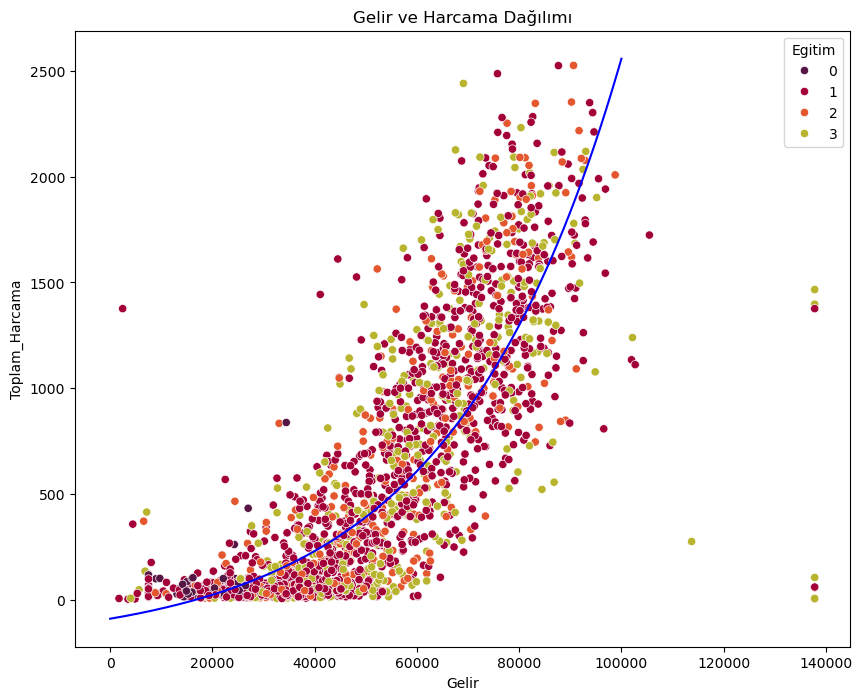

In [45]:
plt.figure(figsize=(10, 8))
sns.scatterplot(x='Gelir', y='Toplam_Harcama', hue='Egitim',palette=egitim_palette, data=df)

def exponential_function(x, a, b, c):
    return a * np.exp(b * x) + c


x_values = np.linspace(0, 100000, 1000)
y_values = exponential_function(x_values, a, b, c)

plt.plot(x_values, y_values, color='blue', label='Eğri')




plt.title('Gelir ve Harcama Dağılımı')

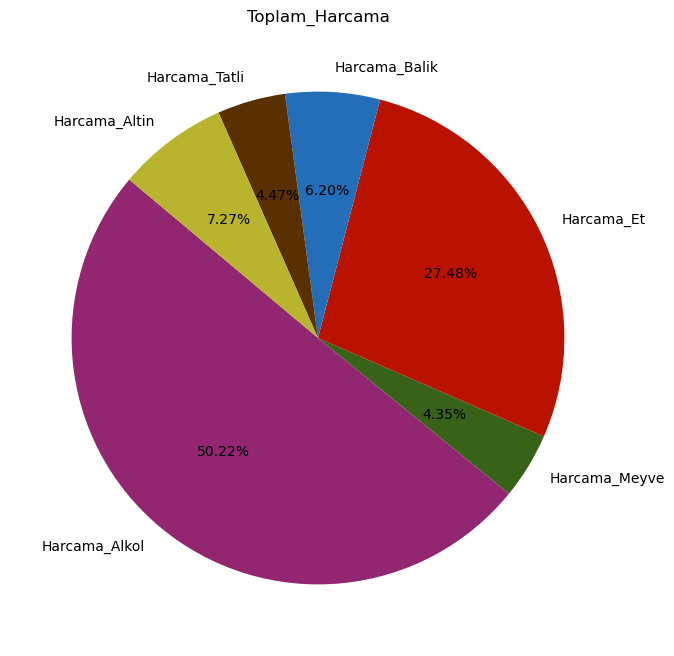

In [46]:
totals = df[['Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin']].sum()
colors = ['#922671','#376218','#ba1200','#246eb9', '#5b3000','#b8b42d']

plt.figure(figsize=(10, 8))
plt.pie(totals, labels=totals.index, autopct='%1.2f%%', startangle=140, colors=colors)
plt.title('Toplam_Harcama')
plt.show()

Harcama miktarlarından yola çıkarak, müşterilerin marketten tercih ettikleri ürünlerin alkol ve et ürünleri olduğu anlaşılmakta.

Text(0.5, 1.0, 'Eğitim Seviyesine Göre Kampanya Katılımı')

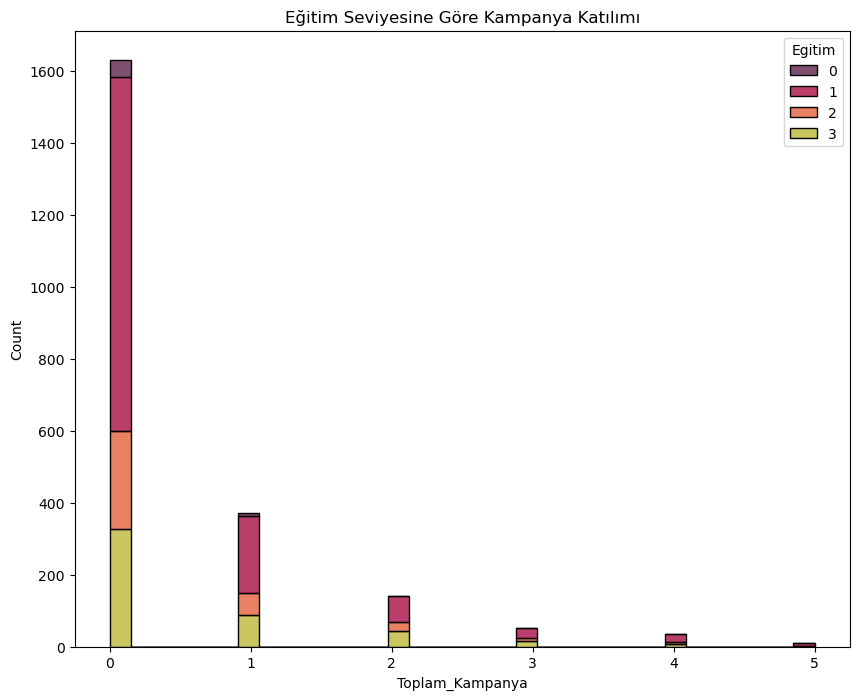

In [47]:
plt.figure(figsize=(10, 8))
sns.histplot(data=df, x='Toplam_Kampanya', hue='Egitim', multiple='stack', palette=egitim_palette)
plt.title('Eğitim Seviyesine Göre Kampanya Katılımı')

In [48]:
tot_kamp_uni = [0, 1, 2, 3, 4, 5]

for i in tot_kamp_uni:
    df_kam = df[df['Toplam_Kampanya'] == i]
    tot_count = df_kam['Toplam_Kampanya'].count()
    mean_gelir = df_kam['Gelir'].mean()
    mean_yas = df_kam['Yas'].mean()
    mean_cocuk = df_kam['Toplam_Cocuk'].mean()
    percent = df_kam['Egitim'].value_counts(normalize=True) * 100
    print(f'################ Toplam Kampanya = {i}: {tot_count} ################ \n')
    print(f'Gelir Ortalamaları: {mean_gelir}')
    print(f'Yas Ortalamaları: {mean_yas}')
    print(f'Cocuk Ortalamalı: {mean_cocuk} \n')
    print(f'Oranlar: \n\n{percent}\n')

################ Toplam Kampanya = 0: 1631 ################ 

Gelir Ortalamaları: 48315.5997023805
Yas Ortalamaları: 44.93500919681177
Cocuk Ortalamalı: 1.0484365419987738 

Oranlar: 

Egitim
1    60.453709
3    20.110362
2    16.554261
0     2.881668
Name: proportion, dtype: float64

################ Toplam Kampanya = 1: 370 ################ 

Gelir Ortalamaları: 56780.86437346438
Yas Ortalamaları: 46.76891891891892
Cocuk Ortalamalı: 0.8189189189189189 

Oranlar: 

Egitim
1    57.837838
3    24.054054
2    16.486486
0     1.621622
Name: proportion, dtype: float64

################ Toplam Kampanya = 2: 142 ################ 

Gelir Ortalamaları: 61353.31313988104
Yas Ortalamaları: 45.33098591549296
Cocuk Ortalamalı: 0.6408450704225352 

Oranlar: 

Egitim
1    51.408451
3    30.281690
2    17.605634
0     0.704225
Name: proportion, dtype: float64

################ Toplam Kampanya = 3: 51 ################ 

Gelir Ortalamaları: 78462.35294117648
Yas Ortalamaları: 42.13725490196079
Cocuk Or

In [49]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Gelir',
       'Son_Alisveris_Tarihi', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et',
       'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Webden_Urun_Sayisi',
       'Katalogdan_Urun_Sayisi', 'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret',
       'Indirimli_Urun_Sayisi', 'Kampanya_1', 'Kampanya_2', 'Kampanya_3',
       'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet', 'Yas',
       'Toplam_Cocuk', 'Toplam_Hane', 'Evebeyn', 'Toplam_Harcama',
       'Toplam_Urun', 'Toplam_Kampanya'],
      dtype='object')

<a id="9"></a>
**5.4. Dağılımsal Özelliklerin Kurtosis ve Skewnesslarının incelenmesi**

In [50]:
num_cols = ['Gelir', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Toplam_Harcama', 'Toplam_Urun']

print('################# Skewness ve Kurtosis Değerleri ################# \n')
for col in num_cols:
    skewness = df[col].skew()
    kurtosis = df[col].kurtosis()
    
    print(f"######### Kolon: {col} #########\nSkewness: {skewness}\nKurtosis: {kurtosis}\n")

################# Skewness ve Kurtosis Değerleri ################# 

######### Kolon: Gelir #########
Skewness: 0.20829551278748107
Kurtosis: -0.10607492457491574

######### Kolon: Harcama_Alkol #########
Skewness: 1.1757705637550502
Kurtosis: 0.5987435935182441

######### Kolon: Harcama_Meyve #########
Skewness: 2.1020633046228268
Kurtosis: 4.050976251101475

######### Kolon: Harcama_Et #########
Skewness: 1.884181301130433
Kurtosis: 3.5403788552815705

######### Kolon: Harcama_Balik #########
Skewness: 1.9197689706698498
Kurtosis: 3.096460912277143

######### Kolon: Harcama_Tatli #########
Skewness: 2.136080712154738
Kurtosis: 4.376548260573513

######### Kolon: Harcama_Altin #########
Skewness: 1.8735691520781044
Kurtosis: 3.429973248197559

######### Kolon: Toplam_Harcama #########
Skewness: 0.8604149537428235
Kurtosis: -0.3375909222013558

######### Kolon: Toplam_Urun #########
Skewness: 0.29054948706799666
Kurtosis: -1.120988913329479



In [51]:
from scipy.stats import boxcox

df_boxcox = df.copy()
for col in num_cols:
    # küçük bir sabit ekleyerek 0 verilerden kurtulalım.
    df_boxcox[col] = df_boxcox[col] + 1e-19
    df_boxcox[col], _ = boxcox(df_boxcox[col])
    skewness = df_boxcox[col].skew()
    kurtosis = df_boxcox[col].kurtosis()
    print(f"######### Kolon: {col} #########\nSkewness: {skewness}\nKurtosis: {kurtosis}\n")

######### Kolon: Gelir #########
Skewness: -0.05890066873717202
Kurtosis: -0.3106795428275091

######### Kolon: Harcama_Alkol #########
Skewness: -0.28238660918268116
Kurtosis: -0.8788161035018978

######### Kolon: Harcama_Meyve #########
Skewness: -1.2647920437263593
Kurtosis: 0.2018754468637982

######### Kolon: Harcama_Et #########
Skewness: -0.00013149934252907743
Kurtosis: -0.581134787234161

######### Kolon: Harcama_Balik #########
Skewness: -1.3027547827484018
Kurtosis: 0.3469553193322157

######### Kolon: Harcama_Tatli #########
Skewness: -1.2368744227101558
Kurtosis: 0.06404959124671095

######### Kolon: Harcama_Altin #########
Skewness: -0.6536831933075634
Kurtosis: 1.3692828386335556

######### Kolon: Toplam_Harcama #########
Skewness: -0.12340933909735505
Kurtosis: -1.3592408584723004

######### Kolon: Toplam_Urun #########
Skewness: -0.2774946940116459
Kurtosis: -0.6418423342718151



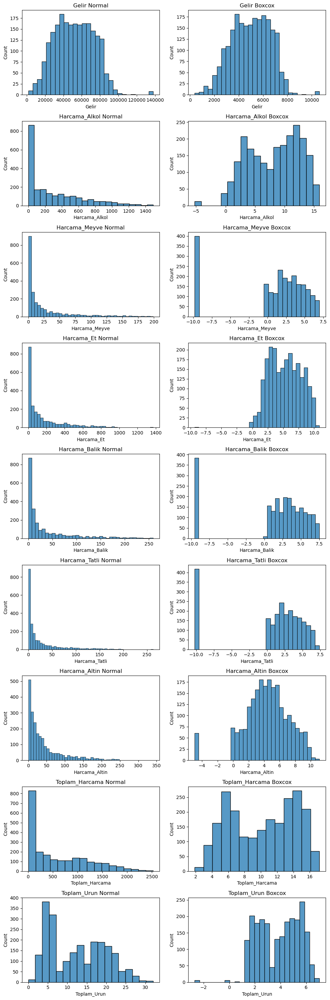

In [52]:
fig, ax = plt.subplots(9, 2, figsize=(10, 30))

for i, col in enumerate(num_cols):
    sns.histplot(x=df[col], ax=ax[i, 0])
    ax[i, 0].set_title(f"{col} Normal")
    sns.histplot(x=df_boxcox[col], ax=ax[i, 1])
    ax[i, 1].set_title(f"{col} Boxcox")

plt.tight_layout()

In [53]:
'''cols_boxcox = [ 'Toplam_Harcama','Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin']

for col in cols_boxcox:
    # Add a small constant to ensure all values are positive
    df[col] = df[col] + 1e-19
    df[col] = boxcox(df[col])[0]'''

"cols_boxcox = [ 'Toplam_Harcama','Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin']\n\nfor col in cols_boxcox:\n    # Add a small constant to ensure all values are positive\n    df[col] = df[col] + 1e-19\n    df[col] = boxcox(df[col])[0]"

In [54]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

for col in num_cols:
    df[col + '_scaled'] = scaler.fit_transform(df[[col]])

<a id="10"></a>
## **6. PCA ve Kümeleme Algoritmaları İle Segmentasyon**

Bu kısımda PCA kullanarak belirli özellikleri, özelliklerinin bir kısmını koruyarak daha az sayıda özelliğe çevireceğiz. Bu sayade hem işlem hızı kazanıp, hem de özellikleri sadeleştirerek daha genelleyici bir model oluşturacağız.

In [55]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Gelir',
       'Son_Alisveris_Tarihi', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et',
       'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Webden_Urun_Sayisi',
       'Katalogdan_Urun_Sayisi', 'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret',
       'Indirimli_Urun_Sayisi', 'Kampanya_1', 'Kampanya_2', 'Kampanya_3',
       'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet', 'Yas',
       'Toplam_Cocuk', 'Toplam_Hane', 'Evebeyn', 'Toplam_Harcama',
       'Toplam_Urun', 'Toplam_Kampanya', 'Gelir_scaled',
       'Harcama_Alkol_scaled', 'Harcama_Meyve_scaled', 'Harcama_Et_scaled',
       'Harcama_Balik_scaled', 'Harcama_Tatli_scaled', 'Harcama_Altin_scaled',
       'Toplam_Harcama_scaled', 'Toplam_Urun_scaled'],
      dtype='object')

In [56]:
#Bu kolonların scale edilmiş hali olduğu için orjinal kolonları çıkarıyoruz
df_pca1 = df.drop(['Gelir', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et', 'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Toplam_Harcama', 'Toplam_Urun'], axis=1)

In [57]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
pca_result = pca.fit_transform(df_pca1)

pca_df = pd.DataFrame(data = pca_result, columns = ['PCA1', 'PCA2', 'PCA3'])

print(pca_df.describe().T)



       count          mean          std          min          25%         50%  \
PCA1  2240.0 -1.429206e-13  3246.662480 -5592.166272 -2763.900004 -133.671046   
PCA2  2240.0 -3.933362e-16    28.932701   -51.356484   -24.850854    0.699507   
PCA3  2240.0  3.210131e-15    11.855737   -27.907952    -8.548142   -1.215299   

              75%          max  
PCA1  2835.585509  5598.855692  
PCA2    25.292744    51.708048  
PCA3     9.578670    47.577314  


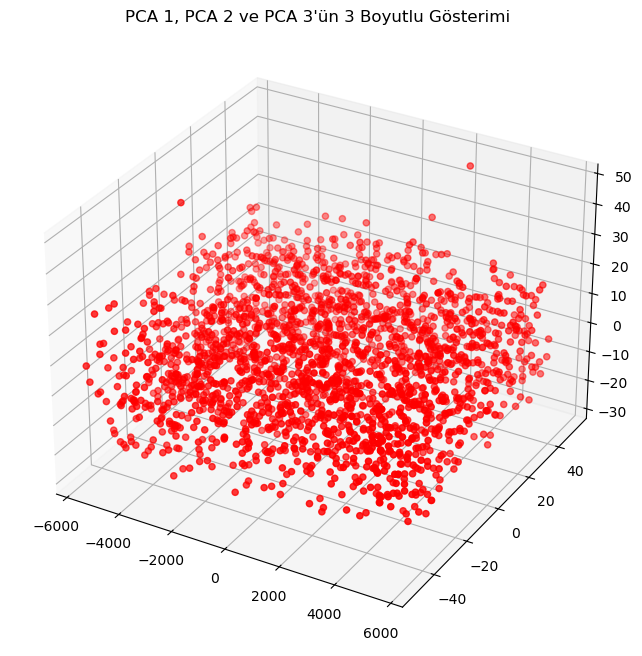

In [58]:
x = pca_df['PCA1']
y = pca_df['PCA2']
z = pca_df['PCA3']

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='r', marker='o')
ax.set_title("PCA 1, PCA 2 ve PCA 3'ün 3 Boyutlu Gösterimi")
plt.show()

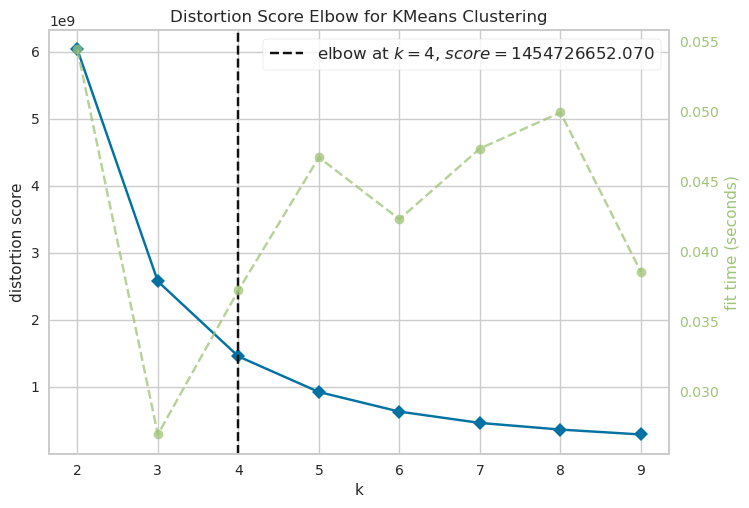

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [59]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

plt.rcParams['font.family'] = 'DejaVu Sans' 




kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,10))
visualizer.fit(pca_df)
visualizer.show()

Elbow metodu uygulandığında burada k=4 küme ve distortion score olarakta 1.4e9 buluyoruz. Score çok yüksek olduğu için istediğimiz gibi bir kümeleme yapamayacağız bu yüzden aşağıda kendi oluşturduğum özellikler üzerinde kümeleme yapacağım.

<Axes: >

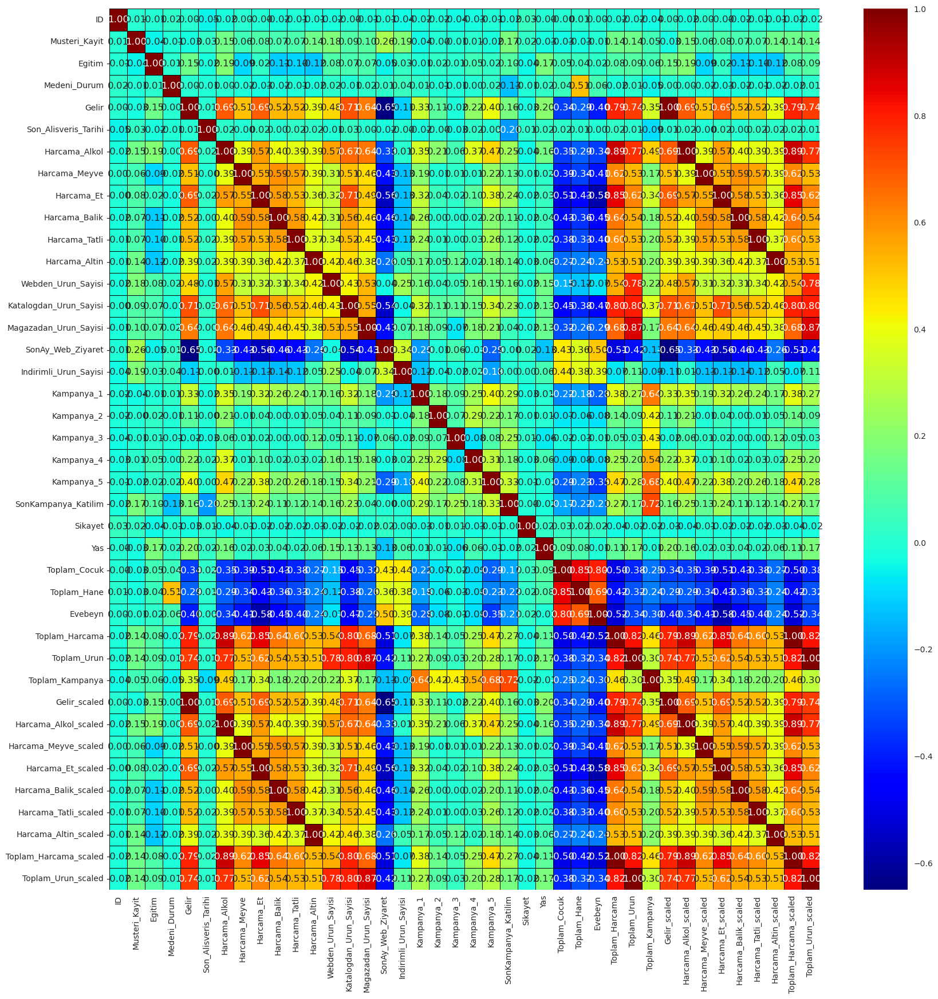

In [60]:
corr_matrix = df.corr()

plt.figure(figsize=(20, 20))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='jet', linewidths=0.5, linecolor='black')

In [61]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Gelir',
       'Son_Alisveris_Tarihi', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et',
       'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Webden_Urun_Sayisi',
       'Katalogdan_Urun_Sayisi', 'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret',
       'Indirimli_Urun_Sayisi', 'Kampanya_1', 'Kampanya_2', 'Kampanya_3',
       'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet', 'Yas',
       'Toplam_Cocuk', 'Toplam_Hane', 'Evebeyn', 'Toplam_Harcama',
       'Toplam_Urun', 'Toplam_Kampanya', 'Gelir_scaled',
       'Harcama_Alkol_scaled', 'Harcama_Meyve_scaled', 'Harcama_Et_scaled',
       'Harcama_Balik_scaled', 'Harcama_Tatli_scaled', 'Harcama_Altin_scaled',
       'Toplam_Harcama_scaled', 'Toplam_Urun_scaled'],
      dtype='object')

In [62]:
pca1 = PCA(n_components=1)
pca_result1 = pca1.fit_transform(df[['Egitim','Yas','Toplam_Hane','Gelir_scaled']])
pca_result2 = pca1.fit_transform(df[['Harcama_Alkol_scaled', 'Harcama_Meyve_scaled', 'Harcama_Et_scaled',
       'Harcama_Balik_scaled', 'Harcama_Tatli_scaled', 'Harcama_Altin_scaled',
       'Toplam_Harcama_scaled', 'Toplam_Urun_scaled']])
pca_result3 = pca1.fit_transform(df[['Kampanya_1', 'Kampanya_2', 'Kampanya_3',
    'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet','Toplam_Kampanya']])

pca_df2 = pd.DataFrame({'PCA1':pca_result1[:, 0], 'PCA2':pca_result2[:, 0], 'PCA3':pca_result3[:, 0]})

pca_df2.describe().T

,count,mean,std,min,25%,50%,75%,max
PCA1,2240.0,3.032495e-15,11.824764,-27.208670,-8.184100,-1.162494,9.826081,47.366594
PCA2,2240.0,4.758099e-17,2.226544,-2.577837,-2.007940,-0.724259,1.782923,6.767241
PCA3,2240.0,1.919100e-16,0.975071,-0.492902,-0.491186,-0.491186,0.532752,4.873857


In [63]:
pca = PCA(n_components=3)
pca_result = pca.fit_transform(df[['Egitim','Yas','Toplam_Hane','Gelir_scaled',
                                'Harcama_Alkol_scaled', 'Harcama_Meyve_scaled', 'Harcama_Et_scaled',
                                'Harcama_Balik_scaled', 'Harcama_Tatli_scaled', 'Harcama_Altin_scaled',
                                'Toplam_Harcama_scaled', 'Toplam_Urun_scaled','Kampanya_1', 'Kampanya_2', 'Kampanya_3',
                                'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet','Toplam_Kampanya']])

pca_df = pd.DataFrame(data = pca_result, columns = ['PCA1', 'PCA2', 'PCA3'])

pca_df.describe().T

,count,mean,std,min,25%,50%,75%,max
PCA1,2240.0,3.406799e-15,11.828089,-27.255307,-8.227646,-1.182415,9.781255,47.431006
PCA2,2240.0,-3.267228e-16,2.427992,-3.555582,-2.076878,-0.791649,1.866754,7.971050
PCA3,2240.0,-8.961086e-17,1.100624,-3.836670,-0.572870,-0.128327,0.585127,4.640811


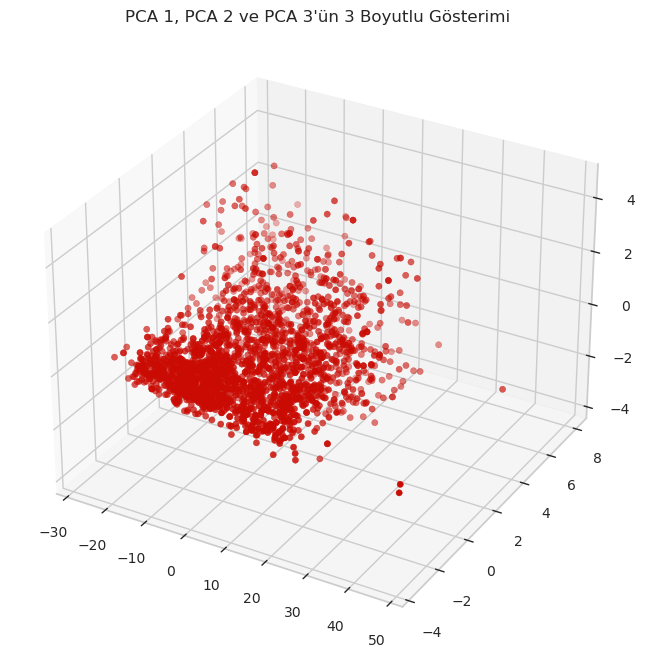

In [64]:
x = pca_df['PCA1']
y = pca_df['PCA2']
z = pca_df['PCA3']

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='r', marker='o')
ax.set_title("PCA 1, PCA 2 ve PCA 3'ün 3 Boyutlu Gösterimi")
plt.show()

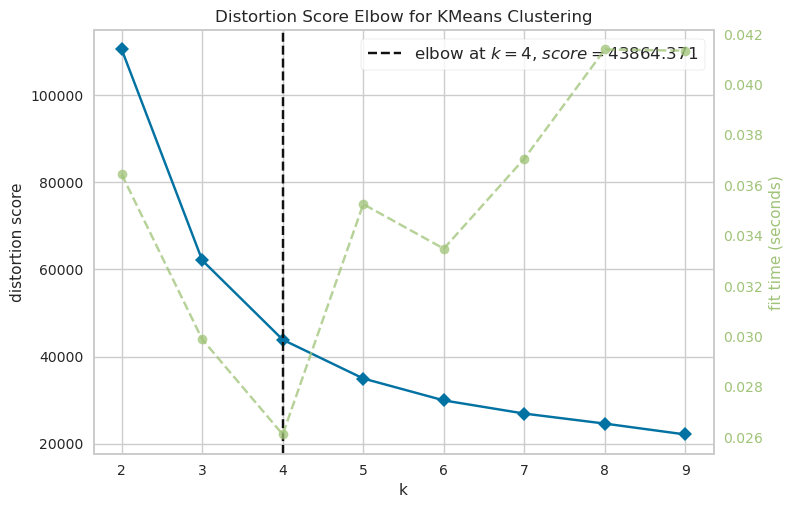

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [65]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

plt.rcParams['font.family'] = 'DejaVu Sans' 




kmeans = KMeans()
visualizer = KElbowVisualizer(kmeans, k=(2,10))
visualizer.fit(pca_df)
visualizer.show()


Burada hem yukarıdaki 3 boyutlu grafiği ve Distortion Score grafiğini incelediğimizde 4 kümede gayet makul bir score yakaladığımızı ve dağılımı daha anlaşılabilir birşekilde oluşturabileceğimizi görebiliyoruz.

In [66]:
kmeans = KMeans(n_clusters=4, random_state=42,max_iter=300)
kmeans.fit(pca_df)
df['Cluster'] = kmeans.labels_


In [67]:
df['Cluster'].value_counts()

Cluster
1    811
0    539
2    466
3    424
Name: count, dtype: int64

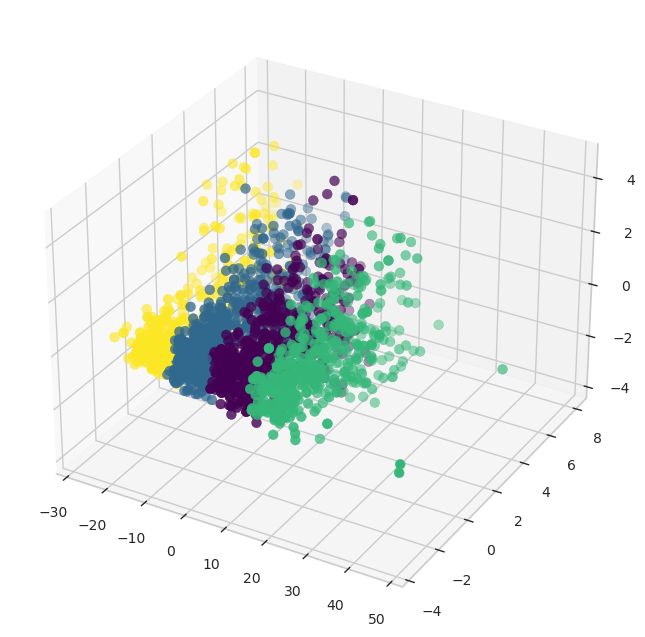

In [68]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, s=50, c=df['Cluster'], marker='o', cmap='viridis')

In [69]:
from sklearn.cluster import AgglomerativeClustering
AgglomerativeClustering(n_clusters=4)
agg = AgglomerativeClustering(n_clusters=4)
agg.fit(pca_df)
df['Cluster_agg'] = agg.labels_


In [70]:
df['Cluster_agg'].value_counts()

Cluster_agg
0    743
2    743
3    444
1    310
Name: count, dtype: int64

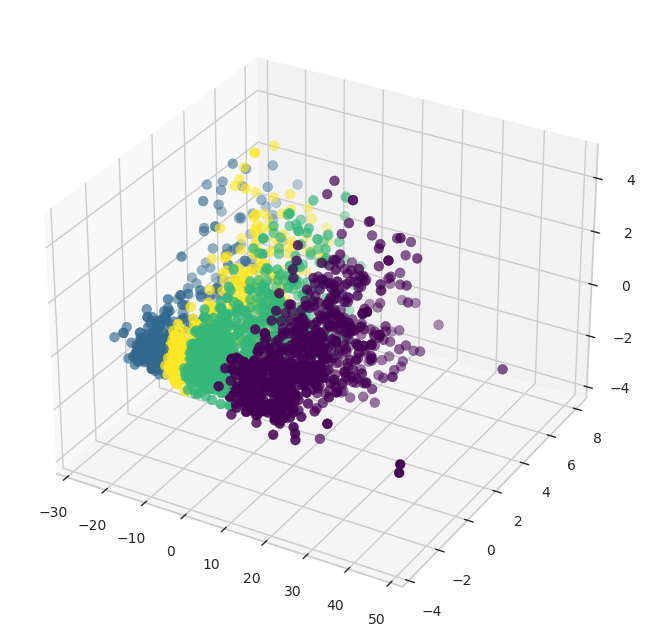

In [71]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, s=50, c=df['Cluster_agg'], marker='o', cmap='viridis')

Burada K-mean ve Agglomerative kümelerin farklarını incelediğimizde birbirine yakın sonuçlar elde ediyoruz. Agglomerative biraz daha keskin kümeleme yaptığı için onu kullanacağım.

In [72]:
df.columns

Index(['ID', 'Musteri_Kayit', 'Egitim', 'Medeni_Durum', 'Gelir',
       'Son_Alisveris_Tarihi', 'Harcama_Alkol', 'Harcama_Meyve', 'Harcama_Et',
       'Harcama_Balik', 'Harcama_Tatli', 'Harcama_Altin', 'Webden_Urun_Sayisi',
       'Katalogdan_Urun_Sayisi', 'Magazadan_Urun_Sayisi', 'SonAy_Web_Ziyaret',
       'Indirimli_Urun_Sayisi', 'Kampanya_1', 'Kampanya_2', 'Kampanya_3',
       'Kampanya_4', 'Kampanya_5', 'SonKampanya_Katilim', 'Sikayet', 'Yas',
       'Toplam_Cocuk', 'Toplam_Hane', 'Evebeyn', 'Toplam_Harcama',
       'Toplam_Urun', 'Toplam_Kampanya', 'Gelir_scaled',
       'Harcama_Alkol_scaled', 'Harcama_Meyve_scaled', 'Harcama_Et_scaled',
       'Harcama_Balik_scaled', 'Harcama_Tatli_scaled', 'Harcama_Altin_scaled',
       'Toplam_Harcama_scaled', 'Toplam_Urun_scaled', 'Cluster',
       'Cluster_agg'],
      dtype='object')

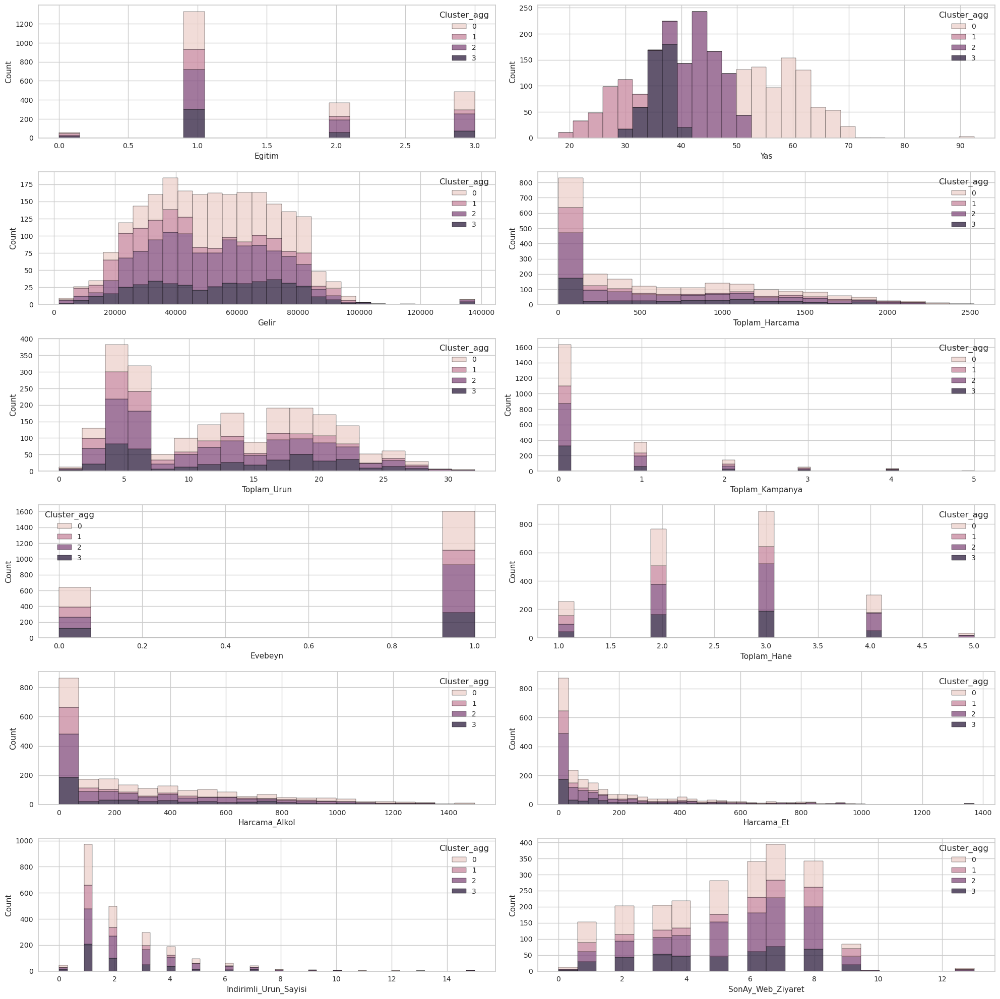

In [73]:
fig, ax = plt.subplots(6, 2, figsize=(20, 20))

sns.histplot(x=df['Egitim'], hue=df['Cluster_agg'], multiple='stack', ax=ax[0, 0])
sns.histplot(x=df['Yas'], hue=df['Cluster_agg'], multiple='stack', ax=ax[0, 1])
sns.histplot(x=df['Gelir'], hue=df['Cluster_agg'], multiple='stack', ax=ax[1, 0])
sns.histplot(x=df['Toplam_Harcama'], hue=df['Cluster_agg'], multiple='stack', ax=ax[1, 1])
sns.histplot(x=df['Toplam_Urun'], hue=df['Cluster_agg'], multiple='stack', ax=ax[2, 0])
sns.histplot(x=df['Toplam_Kampanya'], hue=df['Cluster_agg'], multiple='stack', ax=ax[2, 1])
sns.histplot(x=df['Evebeyn'], hue=df['Cluster_agg'], multiple='stack', ax=ax[3, 0])
sns.histplot(x=df['Toplam_Hane'], hue=df['Cluster_agg'], multiple='stack', ax=ax[3, 1])
sns.histplot(x=df['Harcama_Alkol'], hue=df['Cluster_agg'], multiple='stack', ax=ax[4, 0])
sns.histplot(x=df['Harcama_Et'], hue=df['Cluster_agg'], multiple='stack', ax=ax[4, 1])
sns.histplot(x=df['Indirimli_Urun_Sayisi'], hue=df['Cluster_agg'], multiple='stack', ax=ax[5, 0])
sns.histplot(x=df['SonAy_Web_Ziyaret'], hue=df['Cluster_agg'], multiple='stack', ax=ax[5, 1])


plt.tight_layout()

In [74]:
cols = df.columns[1:25]
rows = [0, 1, 2, 3]

info_table = pd.DataFrame(columns=cols, index=rows)

for row in rows:
    for col in cols:
        col1 = col.split('-')[0]
        if 'Percentage' in col:
            info_table.loc[row, col] = df[df['Cluster_agg'] == int(row)][col1].median()
        else:
            info_table.loc[row, col] = df[df['Cluster_agg'] == int(row)][col1].mean()

info_table.T

,0,1,2,3
Musteri_Kayit,0.958277,0.980645,0.955585,1.015766
Egitim,1.694482,1.329032,1.648721,1.423423
Medeni_Durum,1.786003,1.641935,1.878869,1.867117
Gelir,56914.379147,42538.988761,50367.032076,52814.730504
Son_Alisveris_Tarihi,49.781965,48.329032,48.955585,48.786036
Harcama_Alkol,365.588156,199.716129,281.153432,311.655405
Harcama_Meyve,27.216689,24.235484,23.251682,31.31982
Harcama_Et,181.671602,158.529032,142.767833,185.5
Harcama_Balik,41.336474,33.109677,31.064603,45.042793
Harcama_Tatli,28.504711,25.441935,22.998654,32.583333


In [75]:
cat_cols = ['Egitim',  'Evebeyn', 'Toplam_Hane']
egitim_map = {0: 'Lise', 1: 'Lisans', 2: 'Yuksek_Lisans', 3: 'Doktora'}

for row in rows:
    print(f'################ Cluster {row} ################ \n')
    spe_df = df[df['Cluster_agg'] == row]
    length = spe_df.shape[0]
    for col in cat_cols:
        unique_values = spe_df[col].unique()
        if col == 'Egitim':
            for i in unique_values:
                count = spe_df[spe_df[col] == i].shape[0]
                percent = count / length
                print(f'{col} = {egitim_map[i]}: {count} - %{percent * 100}')
        else:           
            for i in unique_values:
                count = spe_df[spe_df[col] == i].shape[0]
                percent = count / length
                print(f'{col} = {i} : {count} ({percent:.2%})')
        

################ Cluster 0 ################ 

Egitim = Lisans: 402 - %54.104979811574694
Egitim = Doktora: 191 - %25.70659488559892
Egitim = Yuksek_Lisans: 142 - %19.11170928667564
Egitim = Lise: 8 - %1.0767160161507403
Evebeyn = 0 : 252 (33.92%)
Evebeyn = 1 : 491 (66.08%)
Toplam_Hane = 1 : 99 (13.32%)
Toplam_Hane = 3 : 249 (33.51%)
Toplam_Hane = 4 : 123 (16.55%)
Toplam_Hane = 2 : 258 (34.72%)
Toplam_Hane = 5 : 14 (1.88%)
################ Cluster 1 ################ 

Egitim = Lisans: 209 - %67.41935483870968
Egitim = Doktora: 41 - %13.225806451612904
Egitim = Yuksek_Lisans: 40 - %12.903225806451612
Egitim = Lise: 20 - %6.451612903225806
Evebeyn = 1 : 183 (59.03%)
Evebeyn = 0 : 127 (40.97%)
Toplam_Hane = 3 : 119 (38.39%)
Toplam_Hane = 2 : 129 (41.61%)
Toplam_Hane = 1 : 59 (19.03%)
Toplam_Hane = 4 : 3 (0.97%)
################ Cluster 2 ################ 

Egitim = Lisans: 419 - %56.39300134589502
Egitim = Yuksek_Lisans: 133 - %17.900403768506056
Egitim = Doktora: 180 - %24.226110363391655

<a id="11"></a>
## **7. Sonuç**

**Grup 0:**
* Yaş ortalaması 59
* Genellikle lisans üzeri eğitimli
* %66 Evebeyn olan
* Gelirleri ortalaması 57000 olan
* Alkol ve Altın harcamaları en yüksek olan
* En çok şikayette bulunan grup 

#######################################

**Grup 1:**
* Yaş ortalaması 27
* Çoğunlukla lisans eğitimi olan
* 3/5'i evebeyn olan
* Gelirleri ortalaması 42000 olan
* En az Alkol ve Altın harcaması yapan
* Web sitesini en sık ziyaret eden ve Son kampaya katılımı en fazla olan


#######################################

**Grup 2:**
* Yaş ortalaması 44
* Genellikle lisans üzeri eğitimli
* 4/5'i Evebeyn olan
* Gelirleri ortalaması 50000 olan
* Alışveriş tercihleri ortalama olan
* En çok indirimli ürün tercih eden grup


#######################################

**Grup 3:**
* Yaş ortalaması 36
* Çoğunlukla lisans eğitimi olan
* Çoğunlukla Evebeyn olan
* Gelirleri ortalaması 52000 olan
* En çok Meyve, Et, Balık ve Tatlı ürünü satın alan
* En çok indirimli ürün tercih eden grup

#######################################


**Kampanya 1:**

* Bütün ürünler
* 0., 1. ve 3. grubun daha çok tercih ettiği kampanyalardan

#######################################

**Kampanya 2:**

* Alkol ürünleri
* 0.ve 2. grubun daha çok tercih ettiği kampanyalardan

#######################################

**Kampanya 3:**

* Altın ürünleri
* 1.ve 3. grubun daha çok tercih ettiği kampanyalardan

#######################################

**Kampanya 4:**

* Alkol ve et ürünleri
* 0., 2. ve 3. grubun daha çok tercih ettiği kampanyalardan

#######################################

**Kampanya 5:**

* Bütün ürünler
* 0., 1. ve 3. grubun daha çok tercih ettiği kampanyalardan

#######################################

**Son Kampanya:**

* Alkol ve et ürünleri ağırlıklı bütün ürünleri kapsayan
* En çok 3. grup olmak üzere bütün grupların tercih ettiği kampanya
